# Proyecto #1 Clustering de canciones de Spotify

## Integrantes:
* Eduardo Araya
* Martin Depix
* Diego Navia
* Eduardo Rossel

## Objetivos

El objetivo de del proyecto es aplicar las técnicas aprendidas de Clustering para crear listas de reproducción en Spotify.  Revisemos la data disponible, en el archivo `beats.csv`

La data contiene 447662 canciones de spotify, incluyendo sus detalles (artista, álbum, track), ids internos de spotify así como variables numéricas, que representan atributos (features) musicales de esta.

Por ejemplo:
- acousticness ([0-1], estima que tan *acústica* es la canción)
- danceability ([0-1], estima que tan *bailable* es la canción)
- energy ([0-1], estima la intensidad y actividad de la canción) 
- instrumentalness ([0-1], estima que tan *instrumental* es la canción)
- liveness ([0-1] estima  si la canción es en vivo o no)
- loudness ([-60,0] estima la *sonoridad* de la canción, en decibeles promedio)
- speechiness ([0-1] estima la presencia de palabras en la canción)
- valence ([0-1], estima la *positividad* de la canción)
- tempo (mide los *beats por minuto* de la canción)
- key (integer 0 a 11, el tono de la canción. 0=Do, 1=Do#, 2=Re, etc)
- mode ({0,1}: 0 = Major, 1=Minor)
- time_signature (integer 3 a 7, estima el tiempo rítmico, valor 3 significa que es 3/4)
- duration_ms (duración en milisegundos de la canción)

(Mas info: https://developer.spotify.com/documentation/web-api/reference/#/operations/get-audio-features)



In [17]:
# Comandos para la instalación de paquetes
!pip install plotnine
!pip install yellowbrick
!pip install data-science-utils

You should consider upgrading via the '/opt/python/envs/default/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/python/envs/default/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/python/envs/default/bin/python -m pip install --upgrade pip' command.


In [1]:
# Importar paquetes utilizados en el proyecto
import numpy as np
import pandas as pd
from pandas import DataFrame
from plotnine import *
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import matplotlib.ticker as ticker
import time

# Paquetes de preprocesamiento y reducción dimensionalidad.
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Metodos de clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
import scipy.cluster.hierarchy as shc
from yellowbrick.cluster import KElbowVisualizer

# Metricas de performance en clusters
from sklearn.metrics import silhouette_score, davies_bouldin_score, silhouette_samples
from ds_utils.unsupervised import plot_cluster_cardinality, plot_cluster_magnitude, plot_magnitude_vs_cardinality
from scipy.spatial.distance import euclidean

# Ignorar warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [2]:
origData=pd.read_csv("beats.csv")
origData.head()

,artist_name,artist_id,album_id,album_type,album_release_date,album_release_year,album_release_date_precision,danceability,energy,key,...,track_name,track_preview_url,track_number,type,track_uri,external_urls.spotify,album_name,key_name,mode_name,key_mode
0,2Pac,1ZwdS5xdxEREPySFridCfh,1nGbXgS6toEOcFCDwEl5R3,album,2019-08-01,2019.0,day,0.656,0.882,0,...,California Love,https://p.scdn.co/mp3-preview/93e456ef0b73f23f...,1,track,spotify:track:6ayeqYtOtwVhqVB6k6MKoh,https://open.spotify.com/track/6ayeqYtOtwVhqVB...,California Love,C,major,C major
1,2Pac,1ZwdS5xdxEREPySFridCfh,1nGbXgS6toEOcFCDwEl5R3,album,2019-08-01,2019.0,day,0.810,0.642,8,...,Slippin' Into Darkness,https://p.scdn.co/mp3-preview/440595604d3f4946...,2,track,spotify:track:1UDsnzBp8gUCFsrzUDlZI9,https://open.spotify.com/track/1UDsnzBp8gUCFsr...,California Love,G#,major,G# major
2,2Pac,1ZwdS5xdxEREPySFridCfh,1nGbXgS6toEOcFCDwEl5R3,album,2019-08-01,2019.0,day,0.548,0.590,4,...,Ride or Die,https://p.scdn.co/mp3-preview/cc18dc90d609d375...,3,track,spotify:track:3bKs15o7F9VP6GBExCbb6H,https://open.spotify.com/track/3bKs15o7F9VP6GB...,California Love,E,minor,E minor
3,2Pac,1ZwdS5xdxEREPySFridCfh,1nGbXgS6toEOcFCDwEl5R3,album,2019-08-01,2019.0,day,0.839,0.657,5,...,I Ain't Mad At Cha,https://p.scdn.co/mp3-preview/d138f0170423cd9a...,4,track,spotify:track:4L0iAst3yLonw8aGxTRCvb,https://open.spotify.com/track/4L0iAst3yLonw8a...,California Love,F,minor,F minor
4,2Pac,1ZwdS5xdxEREPySFridCfh,1nGbXgS6toEOcFCDwEl5R3,album,2019-08-01,2019.0,day,0.854,0.694,0,...,Static II,https://p.scdn.co/mp3-preview/dddb7d0ea0205338...,5,track,spotify:track:66men3J5qFERvIY06M5hQ9,https://open.spotify.com/track/66men3J5qFERvIY...,California Love,C,minor,C minor


# Paso 1: Selección, limpieza y preprocesamiento de features

- Decida que columnas de los datos usará para su clustering. Se sugiere usar las columnas numéricas (`origData[colFeatures]`), pero puede incluir o sacar otras columns si lo desea que no sean consideradas pertinentes para clusterizar (por ejemplo, el año de la canción, o su duración).
- Decida que filas (datos) utilizará. Puede pre-seleccionar un subconjunto de datos para el trabajo. Por ejemplo, canciones de los 90's, o canciones no-acústicas. 
- Preprocese los datos. Por ejemplo, recuerde que ciertos algoritmos necesitan que los datos estén en la misma escala, y esto no necesariamente se cumple. Podrían haber datos no válidos o outliers que quisiera sacar.

**Requisito:** Describa en la ventana siguiente las decisiones que tomó al respecto, indicando las razones para tomar esta decisión.  En las ventanas siguientes, ponga los códigos utilizados para poder reproducir el resultado final.

### Descripción general de los datos

Con el objetivo de evitar sesgar la data utilizando una filtración arbitraría, inicialmente se realizó la selección de una muestra aleatoria correspondiente al 10% de los datos. Lo anterior, nos permitirá abordar tanto el análisis inicial como la clusterización de manera eficiente. 

In [3]:
# Estudiar el 10% del dataset original
df = origData.sample(frac=0.1,random_state = 2022 )
df

,artist_name,artist_id,album_id,album_type,album_release_date,album_release_year,album_release_date_precision,danceability,energy,key,...,track_name,track_preview_url,track_number,type,track_uri,external_urls.spotify,album_name,key_name,mode_name,key_mode
106529,Frédéric Chopin,7y97mc3bZRFXzT2szRM4L4,1gnklhklCxQ6So7BBensfY,album,2004,2004.0,year,0.3660,0.1590,11,...,"4つのマズルカ, 作品41: 第 2番 ロ長調",https://p.scdn.co/mp3-preview/0f6b71542fbf9347...,29,track,spotify:track:5fg9Ykwq7Dt8qL1eYPQ3Xt,https://open.spotify.com/track/5fg9Ykwq7Dt8qL1...,ショパンの旅路 III 「マヨルカの風」 マヨルカ島にて,B,major,B major
7131,Andrés Calamaro,3tAICgiSR5PfYY4B8qsoAU,6dYwZsDRPxXOUlGQypRqc8,album,1998-04-05,1998.0,day,0.7080,0.5930,2,...,Señal Que Te He Perdido,https://p.scdn.co/mp3-preview/861da4a893e19ca9...,21,track,spotify:track:0j7cSrEDrTiBJIvdriy5ga,https://open.spotify.com/track/0j7cSrEDrTiBJIv...,Obras Cumbres,D,major,D major
360165,Santana,6GI52t8N5F02MxU0g5U69P,5WGelYF98lYE9NIYrFMoRm,album,1983-09-06,1983.0,day,0.4850,0.5270,4,...,Nowhere to Run,https://p.scdn.co/mp3-preview/feb32099b4dcd7b1...,4,track,spotify:track:18hEUtGndAT0vzSTHCKFt4,https://open.spotify.com/track/18hEUtGndAT0vzS...,Shango,E,minor,E minor
291323,Mother Nature Sound FX,4lrOh2SR7H3guHky2lAYOk,4HYL0XhnuCYp4JH115CNH7,album,2020-07-10,2020.0,day,0.0742,0.5410,5,...,Stygian Raven,https://p.scdn.co/mp3-preview/e6fb2cd4691020ff...,31,track,spotify:track:1PX5fWYJRHIhCetslLWwUi,https://open.spotify.com/track/1PX5fWYJRHIhCet...,Entrance For Nature - A Gateway to Explore the...,F,minor,F minor
148619,Johann Sebastian Bach,5aIqB5nVVvmFsvSdExz408,0e8yrpux49X2XcsUqn2bWx,album,2020-07-20,2020.0,day,0.5060,0.2160,11,...,"French Suite No.3 in B minor, BWV 814: 4. Angl...",NaN,58,track,spotify:track:0TKJeymM0rXWwIbLpZqGkt,https://open.spotify.com/track/0TKJeymM0rXWwIb...,The Art of Bach,B,minor,B minor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11897,Antonín Dvořák,6n7nd5iceYpXVwcx8VPpxF,3zfaJpDoruSPhohuWxnFt2,album,2014,2014.0,year,0.5450,0.1250,0,...,"Slovanské tance, 1. řada, Op. 46 (B 83): VII. ...",https://p.scdn.co/mp3-preview/949c89c97c7606bd...,7,track,spotify:track:58cRNZNXTNhg1RUche9vSW,https://open.spotify.com/track/58cRNZNXTNhg1RU...,Antonín Dvořák: Slovanské tance pro čtyřruční ...,C,minor,C minor
88853,Frédéric Chopin,7y97mc3bZRFXzT2szRM4L4,5Mya0ZaO6vJZMOWHXEfcmF,album,2019-12-06,2019.0,day,0.4430,0.3410,1,...,"Études, Op. 10: No. 5 in G-Flat Major ""Black K...",https://p.scdn.co/mp3-preview/606a01904b30dda1...,8,track,spotify:track:40tYsxKXcVamCgQYM5FudO,https://open.spotify.com/track/40tYsxKXcVamCgQ...,Milestones of a Piano Legend: Alexander Brailo...,C#,major,C# major
4579,Alice In Chains,64tNsm6TnZe2zpcMVMOoHL,4AAPRl8BKlsIVC5aeedlBv,album,2018-08-24,2018.0,day,0.5200,0.9400,10,...,Never Fade,https://p.scdn.co/mp3-preview/77f42ce8e2e1838f...,9,track,spotify:track:1s7fF5rM9oJmfpkK4OF8tu,https://open.spotify.com/track/1s7fF5rM9oJmfpk...,Rainier Fog,A#,minor,A# minor
420440,Wolfgang Amadeus Mozart,4NJhFmfw43RLBLjQvxDuRS,5mXRxH7xnsDrIVMnY4fQJC,album,2020-08-07,2020.0,day,0.4850,0.0752,5,...,"Divertimento No.15 in B Flat Major, K.287: Var...",NaN,56,track,spotify:track:70RXKeUvXfVkXQ1ymolf6C,https://open.spotify.com/track/70RXKeUvXfVkXQ1...,夏に聴きたいモーツァルト,F,major,F major


#### Selección de features
Se seleccionaron las columnas cuya variable fuese númericas y que a su vez, tuvieran "interpretabilidad" para generar posteriormente la clusterización. De todas las variables numéricas solo se excluyó la duración de estas.

In [5]:
# Selección de features a estudiar para los clusters
colFeatures = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness',
    'loudness','speechiness','valence','tempo', 'key', 'mode', 'time_signature']
workData = df[colFeatures]
df[colFeatures].describe()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,key,mode,time_signature
count,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000,44762.000000
mean,0.697585,0.390779,0.340480,0.505779,0.223161,-18.700007,0.069289,0.336755,108.789725,5.078124,0.683973,3.732050
std,0.369194,0.183744,0.317696,0.414077,0.221410,8.664802,0.095468,0.273669,31.665605,3.503157,0.464929,0.709279
min,0.000000,0.000000,0.000020,0.000000,0.000000,-52.838000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.392000,0.251000,0.075500,0.001703,0.097000,-24.496750,0.037700,0.088700,82.511250,2.000000,0.000000,4.000000
50%,0.922000,0.369000,0.210000,0.714000,0.123000,-19.538000,0.044300,0.274000,105.679500,5.000000,1.000000,4.000000
75%,0.986000,0.515000,0.579000,0.901000,0.256000,-11.554500,0.058500,0.537000,131.335000,8.000000,1.000000,4.000000
max,0.996000,0.974000,1.000000,1.000000,1.000000,0.487000,0.969000,0.993000,244.952000,11.000000,1.000000,5.000000


#### Revisión de valores nulos

Se revisan los datos para comprobar la completitud. No se encuentran valores perdidos en el dataset con el que se trabajará. 

In [25]:
# Ver la cantidad de valores nulos.
print(round(workData.isnull().sum()/len(workData.energy)*100,2).sort_values(ascending = False).head(10))

acousticness        0.0
danceability        0.0
energy              0.0
instrumentalness    0.0
liveness            0.0
loudness            0.0
speechiness         0.0
valence             0.0
tempo               0.0
key                 0.0
dtype: float64


#### Evaluación de correlación de variables

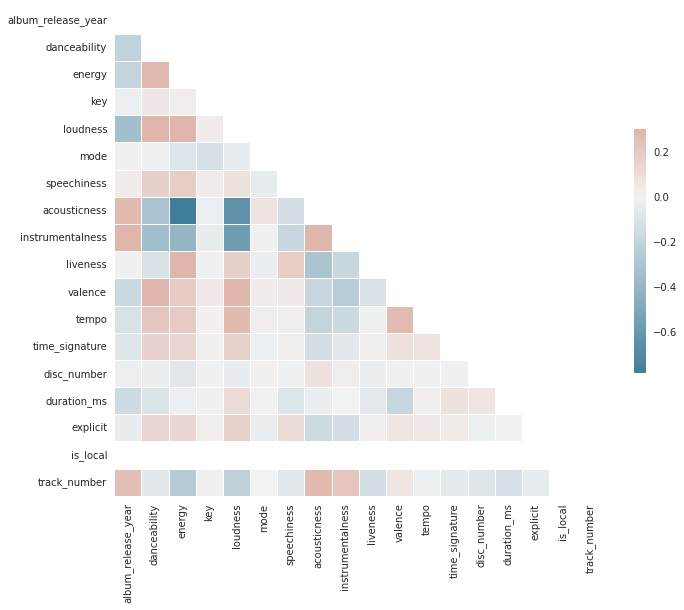

In [10]:
#Evaluamos si existe correlación entre los features
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

A partir del estudio de la correlación de las variables, se aprecia que las variables "Energy" y "Acousticness" están correlacionadas negativamente.

Además, en menor grado, "Loudness" y "Acousticness" están correlacionadas negativamente, al igual que las variables "Loudness" e "Instrumentalness".

Estas variables se definen como:

- Energy: Energía es una medida de 0.0 a 1.0, que representa un porcentaje de intensidad y actividad. Por lo general, las pistas enérgicas se sienten rápidas, fuertes y ruidosas. Por ejemplo, el death metal tiene mucha energía, mientras que un preludio de Bach tiene una puntuación baja en la escala. Las características perceptivas que contribuyen a este atributo incluyen el rango dinámico, el volumen percibido, el timbre, la tasa de inicio y la entropía general.

- Loudness: corresponde a la sonoridad general de una pista en decibelios (dB). Los valores de sonoridad se promedian en toda la pista y son útiles para comparar la sonoridad relativa de las pistas. El volumen es la cualidad de un sonido que es el principal correlato psicológico de la fuerza física (amplitud). Los valores suelen oscilar entre -60 y 0 db.

- Acousticness: una medida de confianza de 0,0 a 1,0 de si la pista es acústica. 1.0 representa una alta confianza en que la pista es acústica.

- Instrumentalness: predice si una pista contiene, o no, voces. Los sonidos "Ooh" y "aah" se tratan como instrumentales en este contexto. Las pistas de rap o de palabras habladas son claramente "vocales". Cuanto más cerca esté el valor de instrumentalidad de 1,0, mayor será la probabilidad de que la pista no contenga contenido vocal. Los valores superiores a 0,5 pretenden representar pistas instrumentales, pero la confianza es mayor a medida que el valor se acerca a 1,0.

A partir de lo anterior, es posible afirmar que aquellas canciones con mayor energía o actividad, tienden a ser canciones no acusticas, lo que coincide con la descripción del ítem "energía".

Además, se observa que las canciones con mayor cantidad de decibeles, tienden a no ser canciones acústicas. Por otro lado, aquellas canciones con más decibeles, tienden a ser canciones "vocales" en comparación con canciones considradas como instrumentales.

Por último se observa que no hay variables correlacionadas positivamente, ya que el índice de correlación alcanza un valor máximo de 0.2 sobre 1.

### Estandarización de los datos


In [6]:
# Estandarización de los datos
scaler = StandardScaler()
workData_std = scaler.fit_transform(workData)
workData_std = pd.DataFrame(workData_std, columns=workData.columns)
workData_std.describe()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,key,mode,time_signature
count,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04,4.476200e+04
mean,1.714568e-16,2.106750e-17,-9.020283e-17,-1.436157e-16,1.406435e-16,1.340988e-16,-8.171655e-17,-1.707921e-16,3.119796e-16,7.109822e-16,5.064534e-16,-8.234059e-16
std,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00,1.000011e+00
min,-1.889503e+00,-2.126782e+00,-1.071667e+00,-1.221475e+00,-1.007920e+00,-3.939891e+00,-7.257866e-01,-1.230531e+00,-3.435619e+00,-1.449601e+00,-1.471151e+00,-5.261811e+00
25%,-8.277184e-01,-7.607350e-01,-8.340789e-01,-1.217363e+00,-5.698144e-01,-6.690063e-01,-3.308870e-01,-9.064140e-01,-8.298837e-01,-8.786814e-01,-1.471151e+00,3.777830e-01
50%,6.078576e-01,-1.185294e-01,-4.107130e-01,5.028601e-01,-4.523840e-01,-9.671335e-02,-2.617534e-01,-2.293122e-01,-9.822202e-02,-2.230136e-02,6.797396e-01,3.777830e-01
75%,7.812102e-01,6.760640e-01,7.507891e-01,9.544715e-01,1.483174e-01,8.246682e-01,-1.130114e-01,7.317119e-01,7.119879e-01,8.340787e-01,6.797396e-01,3.777830e-01
max,8.082965e-01,3.174135e+00,2.075972e+00,1.193560e+00,3.508632e+00,2.214387e+00,9.424284e+00,2.397974e+00,4.300054e+00,1.690459e+00,6.797396e-01,1.787682e+00


### Análisis de componentes principales

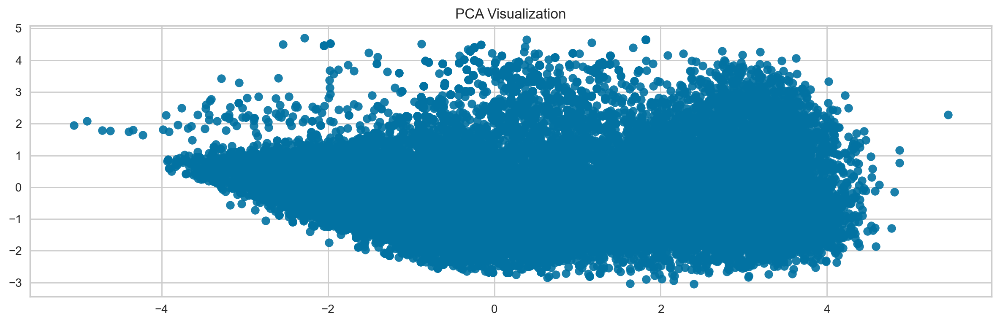

In [18]:
# Visualizing
from sklearn.decomposition import PCA

fig, ax1 = plt.subplots(figsize=(12,4), dpi=200)

# PCA
pca_scaled_std = PCA(n_components=2,random_state=42)
X_std_pca = pca_scaled_std.fit_transform(workData_std)
df_std_pca = pd.DataFrame(X_std_pca,columns = ['x_pca','y_pca'])

ax1.scatter(df_std_pca.loc[:,'x_pca'],
            df_std_pca.loc[:,'y_pca'],
            alpha=0.9
            )

ax1.set_title("PCA Visualization")
plt.tight_layout()
plt.show()

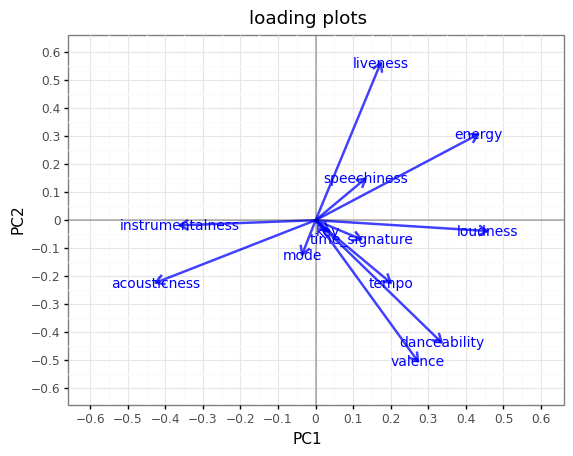

<ggplot: (8762766877022)>

In [19]:
#Analizando los componentes
datapc = pd.DataFrame(pca_scaled_std.components_.transpose(),columns=["PC1","PC2"])
datapc['varNames']=workData_std.columns
datapc
(ggplot(datapc)+
  theme_bw()+
  labs(title="loading plots")+
  geom_text(aes(x="PC1", y="PC2", label="varNames"), size = 10, color="blue")+
  geom_segment(aes(x=0, y=0, xend="PC1", yend="PC2"), arrow=arrow(length=0.1),size=1, alpha=0.75, color="blue")+
  scale_x_continuous(limits=[-0.9,0.9],breaks=[-0.6,-0.5,-0.4,-0.3,-0.2,-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6])+
  scale_y_continuous(limits=[-0.9,0.9],breaks=[-0.6,-0.5,-0.4,-0.3,-0.2,-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6])+
  geom_hline(yintercept = 0, size=.2)+
  geom_vline(xintercept = 0, size=.2)+
  coord_cartesian([-0.6,0.6],[-0.6,0.6])
)

Al revisar las componentes obtenidas en el plano bidimensional, se observa que en el primer cuadrante (PC1 > 0, PC2 > 0) predominan características como _liveness_, _energy_ y _speechness_. Por su parte en el tercer cuadrante, se hacen más presentes otras características como _instrumentalness_ y _acousticness_. El resto de las características parece predominar en el cuarto cuadrante. Lo anterior puede dar señales de que la clusterización podría clasificar de manera distinta los puntos de estas áreas.

# Paso 2: Clustering de canciones

- Realice alguna de las técnica de clustering vistas en el curso a las canciones seleccionadas. Pruebe distintas alternativas. si es pertinente realice calibración de los parámetros (# clusters, métrica a usar, tipo de *linkage* si usa cluster jerárquicos, etc)

A continuación se describen los 3 métodos utilizados para determinar los clusters en el conjunto de datos definidos: K-Means, DBSCAN y Gaussian Mixture

### K Means

En primer lugar, implementamos el método del codo para poder determinar posibles K para el proceso de clusterización.

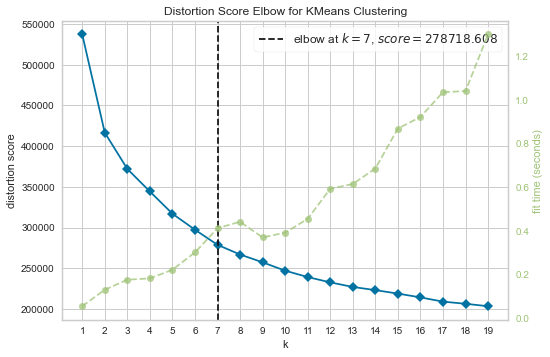

In [20]:
# Uso método del codo para determinar el número de clusters
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer

fig, ax = plt.subplots()

kmeans = KMeans(n_clusters=(1,20), 
                max_iter=300, 
                tol=1e-04, 
                init='k-means++', 
                n_init=10, 
                random_state=42, 
                algorithm='auto')

visualizer = KElbowVisualizer(kmeans, k=(1,20),ax=ax)
visualizer.fit(workData_std)

ax.set_xticks(range(1,20))
visualizer.show()
plt.show()

Para el mismo número de cluster, calculamos los indicadores de _Silhouette_ y _Davies-Bouldin_, de modo de contrastar estos indicadores con la regla del codo.

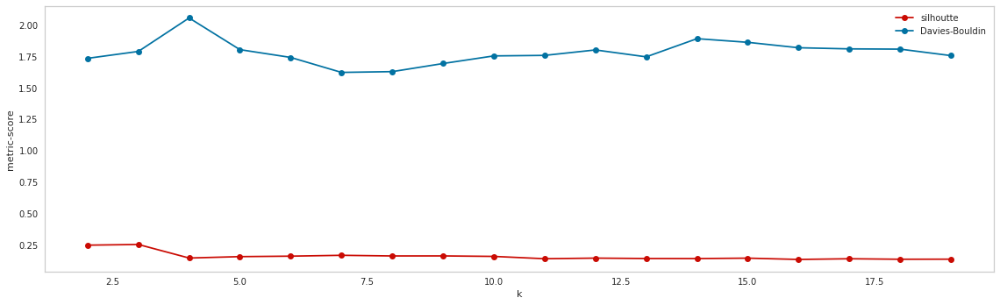

In [15]:
# Indicadores para cada número de clusters
rendimiento = {'k': [], 'distancia': [], 'silhouette': [], 'Davies-Bouldin': []}
# Numero maximo de clusters
max_clusters = 20
K_values = list(range(2, max_clusters))
for k in K_values:
    # Instancia del modelo
    model = KMeans(n_clusters=k, 
                max_iter=300, 
                tol=1e-04, 
                init='k-means++', 
                n_init=10, 
                random_state=42, 
                algorithm='auto')
    # Ajuste del modelo y métricas
    model.fit(workData_std)
    prediccion = model.predict(workData_std)
    rendimiento['distancia'].append( model.inertia_ )
    rendimiento['silhouette'].append( silhouette_score(X=workData_std, 
                                                       labels=prediccion, 
                                                       metric='euclidean') )
    rendimiento['Davies-Bouldin'].append( davies_bouldin_score(X=workData_std, 
                                                               labels=prediccion) )
    rendimiento['k'].append(k)

# Dataframe del rendimiento de los resultados
rendimiento = DataFrame(rendimiento)
rendimiento

# Grafica de las metricas
plt.figure(figsize=(16, 5))
plt.plot(rendimiento['k'], rendimiento['silhouette'], 'ro-', label='silhoutte')
plt.plot(rendimiento['k'], rendimiento['Davies-Bouldin'], 'bo-', label='Davies-Bouldin')
plt.xlabel('k'); plt.ylabel('metric-score'); plt.legend(); plt.grid()
plt.tight_layout(); plt.show()

El análisis de silueta se puede utilizar para estudiar la distancia de separación entre los grupos resultantes. Realizaremos este análisis para los 7 primeros k en K-Means. El gráfico de silueta muestra una medida de qué tan cerca está cada punto en un grupo de puntos con sus vecinos, además si los valores son cercanos a +1 tendremos que la muestra está más lejos de los vecinos. 

A partir de los gráficos podemos observar que para los números de clusters 5 y 6, presentan una mayor cantidad de puntos por sobre el promedio del la silueta para todo el grupo. Además hay una menor cantidad de puntos con valores negativos. 

Además, a partir del grosor del gráfico de silueta, se puede visualizar el tamaño del grupo. En el caso de 5 y 6 clusters, se aprecian clúster de tamaño similar con excepción del clúster 1 para k = 5 o el cluster 4 en el caso de k = 6. 

--- 379.4202275276184 seconds ---


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


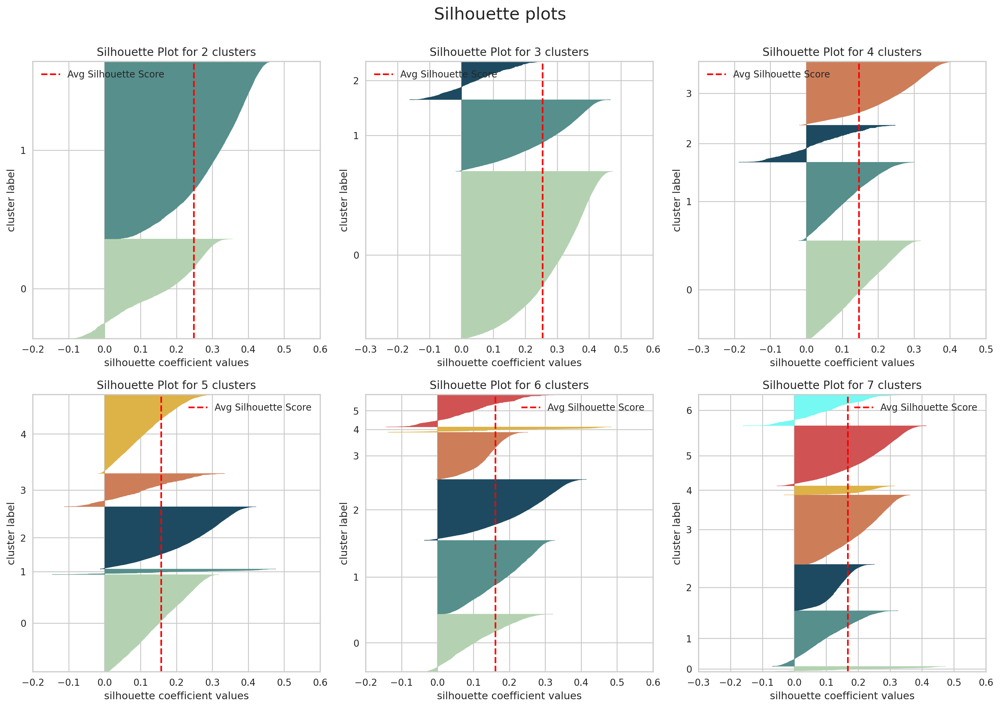

In [16]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.ticker as ticker
import time

cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252', '#75f9f2']

def silhouette_plot(X, model, ax, colors):
    y_lower = 10
    y_tick_pos_ = []
    sh_samples = silhouette_samples(X, model.labels_)
    sh_score = silhouette_score(X, model.labels_)
    
    for idx in range(model.n_clusters):
        values = sh_samples[model.labels_ == idx]
        values.sort()
        size = values.shape[0]
        y_upper = y_lower + size
        ax.fill_betweenx(np.arange(y_lower, y_upper),0,values,
                         facecolor=colors[idx],edgecolor=colors[idx]
        )
        y_tick_pos_.append(y_lower + 0.5 * size)
        y_lower = y_upper + 10

    ax.axvline(x=sh_score, color="red", linestyle="--", label="Avg Silhouette Score")
    ax.set_title("Silhouette Plot for {} clusters".format(model.n_clusters))
    l_xlim = max(-1, min(-0.1, round(min(sh_samples) - 0.1, 1)))
    u_xlim = min(1, round(max(sh_samples) + 0.1, 1))
    ax.set_xlim([l_xlim, u_xlim])
    ax.set_ylim([0, X.shape[0] + (model.n_clusters + 1) * 10])
    ax.set_xlabel("silhouette coefficient values")
    ax.set_ylabel("cluster label")
    ax.set_yticks(y_tick_pos_)
    ax.set_yticklabels(str(idx) for idx in range(model.n_clusters))
    ax.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
    ax.legend(loc="best")
    return ax


start_time = time.time()

# Plot for multiple ks
k_max = 7
ncols = 3
# calculate number of rows
nrows = k_max // ncols + (k_max % ncols > 0)
# set figure size
fig = plt.figure(figsize=(15,15), dpi=200)

for k in range(2,k_max+1):
    
    # Apply clustering for k clusters
    km = KMeans(n_clusters=k, 
                max_iter=300, 
                tol=1e-04, 
                init='k-means++', 
                n_init=10, 
                random_state=42, 
                algorithm='auto')

    km_fit = km.fit(workData_std)
    
    # create chart
    ax = plt.subplot(nrows, ncols, k-1)
    silhouette_plot(workData_std, km_fit,ax, cluster_colors)

fig.suptitle("Silhouette plots", fontsize=18, y=1)
plt.tight_layout()
plt.show()

print("--- %s seconds ---" % (time.time() - start_time))

Para continuar observando los clusters obtenidos por K Means, se seleccionará un número de 6 clústers. Este número es tentativo y ya que aún quedan otros métodos para ser implementados.

#### Cardinalidad y magnitud de los clústers

A continuación graficaremos la cardinalidad de los clústers escogidos. Los clústers del 0 al 3 muestran tamaños relativamente similares, por su parte el clúster 4 es el que presenta la menor cantidad de puntos. 

El gráfico de magnitud del clusters muestra la distancia total entre el punto y el centroide por grupo. Este gráfico se puede usar para ver qué tan alta es la "dispersión" de los puntos en cada grupo.  

Más que observar la magnitud, se explora el tercer gráfico de Cardinalidad vs Magnitud, donde se compara cardinalidad y magnitud juntos. Podemos observar que los clústers se encuentran muy cerca de la línea de 45 grados, con excepción de los clústers 2 y 5. En este punto puede ser necesario reducir el número de clústers a 5 y observar si los clústers se alinean mejor en la línea de 45 grados. 

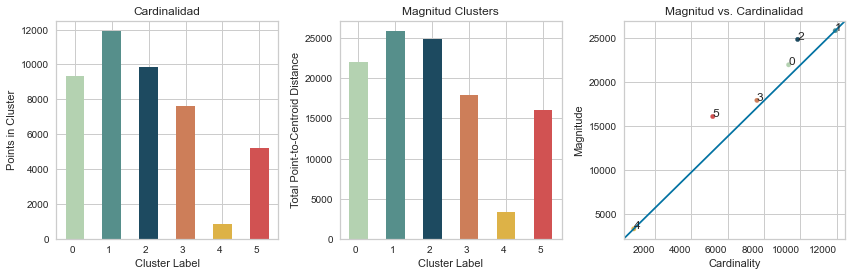

In [11]:
# Testeo de soluciones hasta el momento.
cluster_choice = 6
# Let's define max. 6 different cluster colors - if you like you can add here more.
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252', '#75f9f2']

km = KMeans(n_clusters= cluster_choice, 
            max_iter=300, 
            tol=1e-04, 
            init='k-means++', 
            n_init=10, 
            random_state=42, 
            algorithm='auto')

km_fit = km.fit(workData_std)

#!pip install data-science-utils
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12,4))

plot_cluster_cardinality(km_fit.labels_,
                         ax=ax1,
                         title="Cardinalidad",
                         color=cluster_colors
                        )
plot_cluster_magnitude(workData_std,
                       km_fit.labels_,
                       km_fit.cluster_centers_,
                       euclidean,
                       ax=ax2,
                       title="Magnitud Clusters",
                       color=cluster_colors
                      )
plot_magnitude_vs_cardinality(workData_std,
                              km_fit.labels_,
                              km_fit.cluster_centers_,
                              euclidean,
                              color=cluster_colors[0:km_fit.n_clusters],
                              ax=ax3, 
                              title="Magnitud vs. Cardinalidad")

fig.autofmt_xdate(rotation=0)
plt.tight_layout()
plt.show()

#### Exploración gráfica de los clústers

La exploración de la clusterización por pares de variables permite ver:
* El cluster 4 se caracteríza por tener mayor niveles de speechness
* Los clusters 1 y 5 parecen tener características similares.
* El clúster 3 parece mostrar mayores niveles de energía. 

En el punto 3 de este proyecto profundizaremos en la caracterización de los clústers definidos.

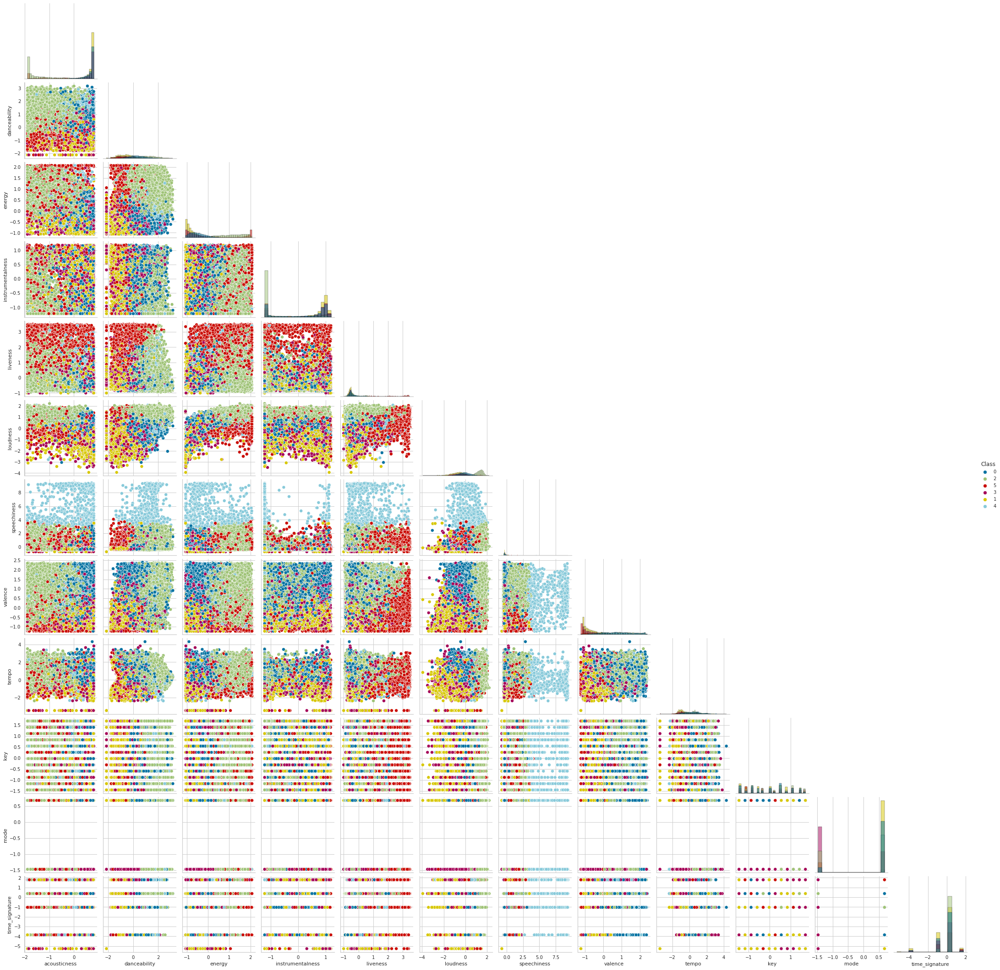

In [17]:
# Graficamos por par de variables
report_model = workData_std.copy()
report_model['Class'] = km_fit.labels_.astype(str)

sns.pairplot(data=report_model, hue='Class', corner=True, diag_kind='hist')

El análisis por PCA en conjunto con la clusterización tentativa, muestra que para 6 clústers los puntos de estos se superponen. El clúster 4 parece montarse encima de los clústers 2, 3 y 5. Esto podría indicar que reducir a 5 clústers puede ser una mejor alternativa.

In [12]:
df_labels = pd.concat([pd.DataFrame(X_std_pca),pd.DataFrame(km_fit.labels_)], axis = 1)
df_labels.columns = ['x_pca','y_pca','labels']

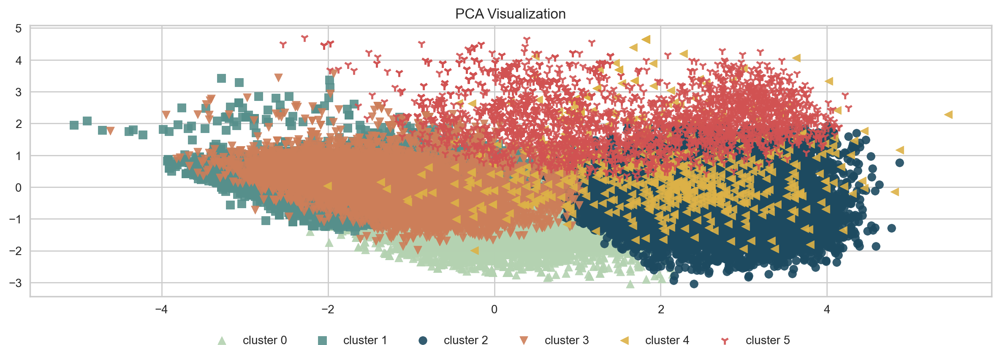

In [13]:
# Visualizing pca
from sklearn.decomposition import PCA

fig, ax1 = plt.subplots(figsize=(12,4), dpi=200)

# PCA
pca_scaled_std = PCA(n_components=2,random_state=42)
X_std_pca = pca_scaled_std.fit_transform(workData_std)

for l, c, m in zip(range(0, 6), cluster_colors[0:km_fit.n_clusters], ('^', 's', 'o','v','<','1')):
    ax1.scatter(df_labels[df_labels.labels == l].loc[:,'x_pca'],
                df_labels[df_labels.labels == l].loc[:,'y_pca'],
                color=c,
                label='cluster %s' % l,
                alpha=0.9,
                marker=m
                )

ax1.set_title("PCA Visualization")
labels = np.unique(km_fit.labels_)
labels = ["cluster "+str(l) for l in labels]
fig.legend(labels, loc='lower center',ncol=len(labels), bbox_transform=(1,0),borderaxespad=-0.5)
plt.tight_layout()
plt.show()

### DBSCAN

Para implementar el algoritmo es necesario definir el valor de eps y de vecinos mínimos para la determinación de los puntos core.

**Determinar el mejor epsilon**

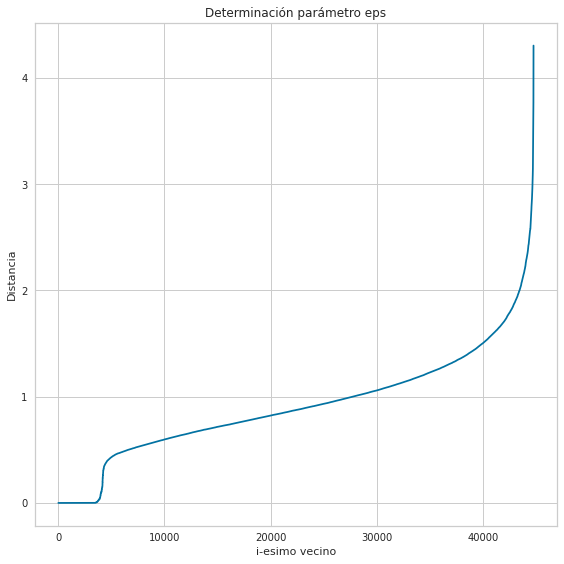

In [22]:
## Numero de vecinos
n_vecinos = 10

## Instancia del modelo
neighbors_model = NearestNeighbors(n_neighbors=n_vecinos)

## Ajuste del modelo
neighbors_model = neighbors_model.fit(workData_std)

## Computar de los n vecinos más cercano y los indices de las muestras vecinos
distancias, indices = neighbors_model.kneighbors(workData_std)

## Reservamos la distancia maxima del vecino cercano para cada punto y los ordenamos
distancias = distancias.max(axis=1)
distancias.sort()

## Agrupemos la informacion en un dataframe
reporte = pd.DataFrame({'i-esimo punto': range(1, len(distancias)+1),
                    'distancia': distancias})

ig, ax = plt.subplots()
ax.plot(reporte['i-esimo punto'], reporte.distancia)
ax.set_title('Determinación parámetro eps')
ax.set_xlabel('i-esimo vecino')
ax.set_ylabel('Distancia')
plt.tight_layout()
plt.show()

**Elección del número de puntos mínimos**

No existe un método automático para determinar el número mínimo de puntos. Algunos autores plantean las siguientes reglas
* En general, _MinPts_ debe tener un valor mayor o igual a la dimensionalidad de la data.
* Si la data tiene más de dos dimensiones, escoger MinPts = 2*dim, donde dim= la dimensión del dataset. (Sander et al., 1998).

La última regla es la que será utilizada en este caso.

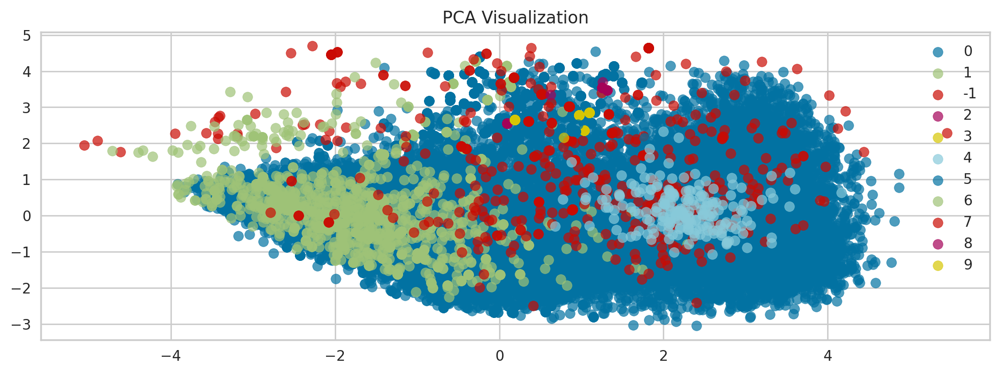

In [17]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=2.3, min_samples=2*len(workData_std.columns))
dbscan.fit(workData_std)

clusters_dbscan = dbscan.labels_

df_labels_dbscan = pd.concat([df_std_pca[['x_pca','y_pca']], 
                              pd.DataFrame(clusters_dbscan,columns=['cluster_dbscan'])], axis = 1)

df_labels_dbscan_no_noise = df_labels_dbscan[df_labels_dbscan.cluster_dbscan != -1]

# Visualizando pca
from sklearn.decomposition import PCA

fig, ax1 = plt.subplots(figsize=(12,4), dpi=200)

for l in df_labels_dbscan.cluster_dbscan.unique():
    ax1.scatter(df_labels_dbscan[df_labels_dbscan.cluster_dbscan == l].loc[:,'x_pca'],
                df_labels_dbscan[df_labels_dbscan.cluster_dbscan == l].loc[:,'y_pca'],
                alpha = 0.7,
                label = l)

ax1.set_title("PCA Visualization")
ax1.legend()
plt.show()

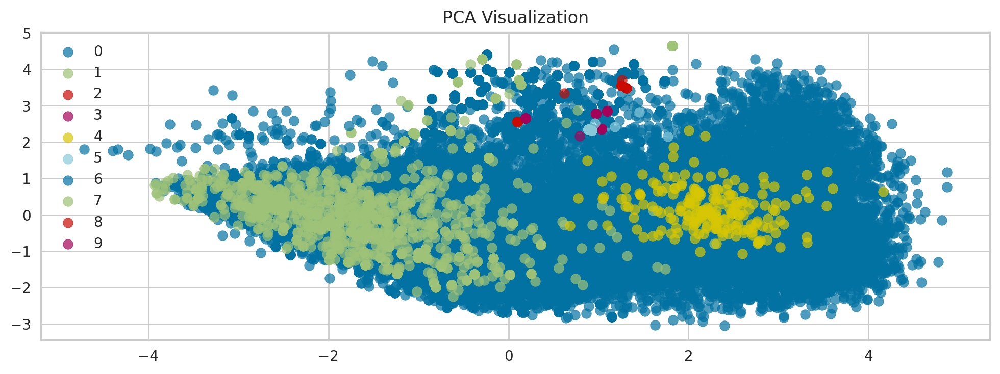

In [22]:
# Visualizando pca (sin puntos ruido)
from sklearn.decomposition import PCA

fig, ax1 = plt.subplots(figsize=(12,4), dpi=200)

for l in df_labels_dbscan_no_noise.cluster_dbscan.unique():
    ax1.scatter(df_labels_dbscan_no_noise[df_labels_dbscan_no_noise.cluster_dbscan == l].loc[:,'x_pca'],
                df_labels_dbscan_no_noise[df_labels_dbscan_no_noise.cluster_dbscan == l].loc[:,'y_pca'],
                alpha = 0.7,
                label = l)

ax1.set_title("PCA Visualization")
ax1.legend()
plt.show()

El método DBSCAN entrega un gran clúster y otros más pequeños. Esto se aprecia en los gráficos de dispersión por pares de variables del dataset. 

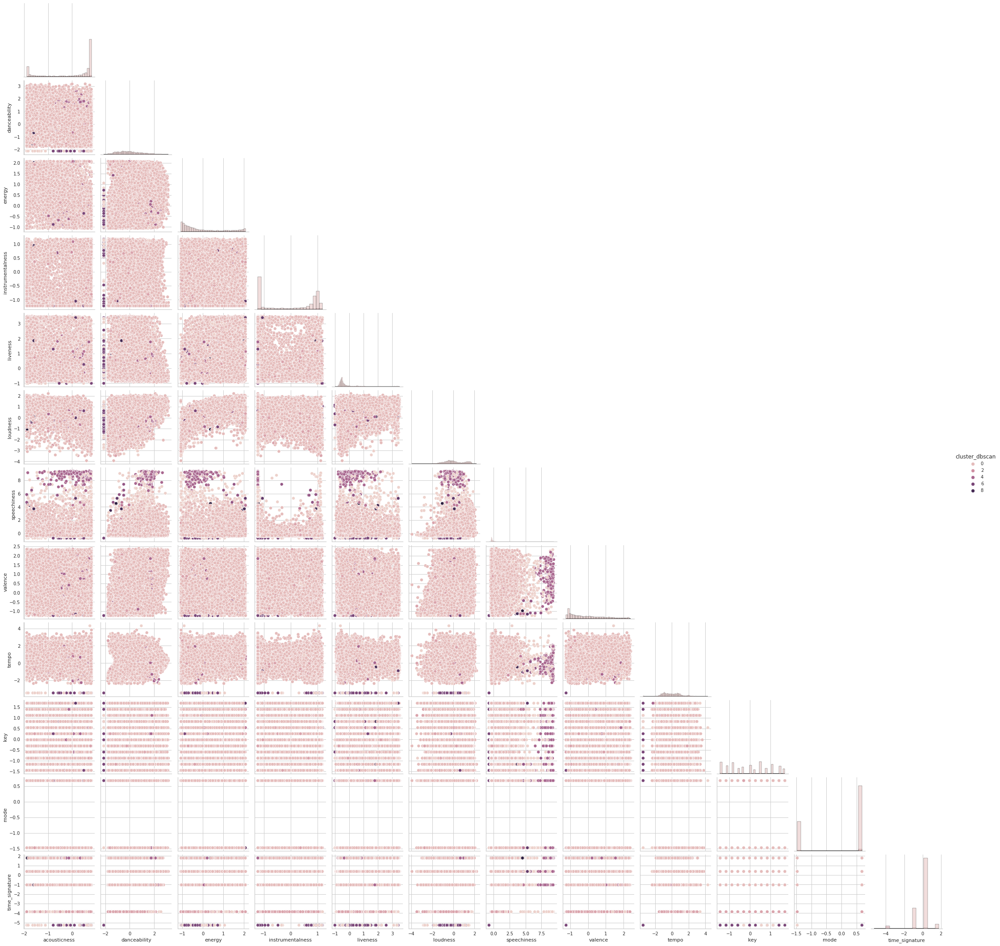

In [28]:
# Graficamos por par de variables
sns.pairplot(data=pd.concat([workData_std, 
                              pd.DataFrame(clusters_dbscan,columns=['cluster_dbscan'])], axis = 1)
        , hue='cluster_dbscan', corner=True, diag_kind='hist')

### Método de clustering Gaussiano


In [34]:
### Buscar el mejor número de clusters 

start_time = time.time()

report_model = {'k': [], 'BIC': [], 'silhouette': [], 'Davies-Bouldin': []}

## Numero de cluster
max_clusters=30

for n_clusters in range(2, max_clusters):

    ## Instancia del modelo
    model = GaussianMixture(n_components=n_clusters, 
                            covariance_type="full")

    ## Ajuste dle modelo
    model.fit(workData_std)
    prediccion = model.predict(workData_std)
    
    ## Almacenar metricas
    report_model['k'].append(n_clusters)
    report_model['BIC'].append( model.bic(workData_std) )
    report_model['silhouette'].append( silhouette_score(X=workData_std, 
                                                       labels=prediccion, 
                                                       metric='euclidean') )
    report_model['Davies-Bouldin'].append( davies_bouldin_score(X=workData_std, 
                                                               labels=prediccion) )
print("--- %s seconds ---" % (time.time() - start_time))
    
## Convertir el reporte a dataframe
report_model = DataFrame(report_model)
report_model




--- 598.915718793869 seconds ---


,k,BIC,silhouette,Davies-Bouldin
0,2,1.120264e+06,0.189268,2.030459
1,3,8.019650e+05,0.031280,3.131175
2,4,7.623291e+05,0.013996,3.407665
3,5,5.019878e+05,0.060002,2.367286
4,6,7.283796e+05,0.007357,2.850099
5,7,4.723851e+05,0.092227,2.890254
6,8,4.002979e+05,0.038464,3.240511
7,9,5.930450e+05,-0.025268,4.283697
8,10,4.345082e+05,-0.009674,2.297910
9,11,3.435595e+05,0.017847,3.169546


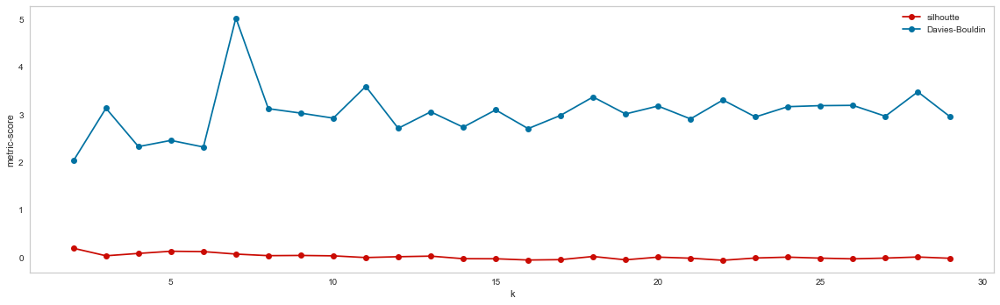

In [28]:
## Grafica de las metricas
plt.figure(figsize=(16, 5))
plt.plot(report_model['k'], report_model['silhouette'], 'ro-', label='silhoutte')
plt.plot(report_model['k'], report_model['Davies-Bouldin'], 'bo-', label='Davies-Bouldin')
plt.xlabel('k'); 
plt.ylabel('metric-score'); 
plt.legend(); 
plt.grid()
plt.tight_layout(); 
plt.show()

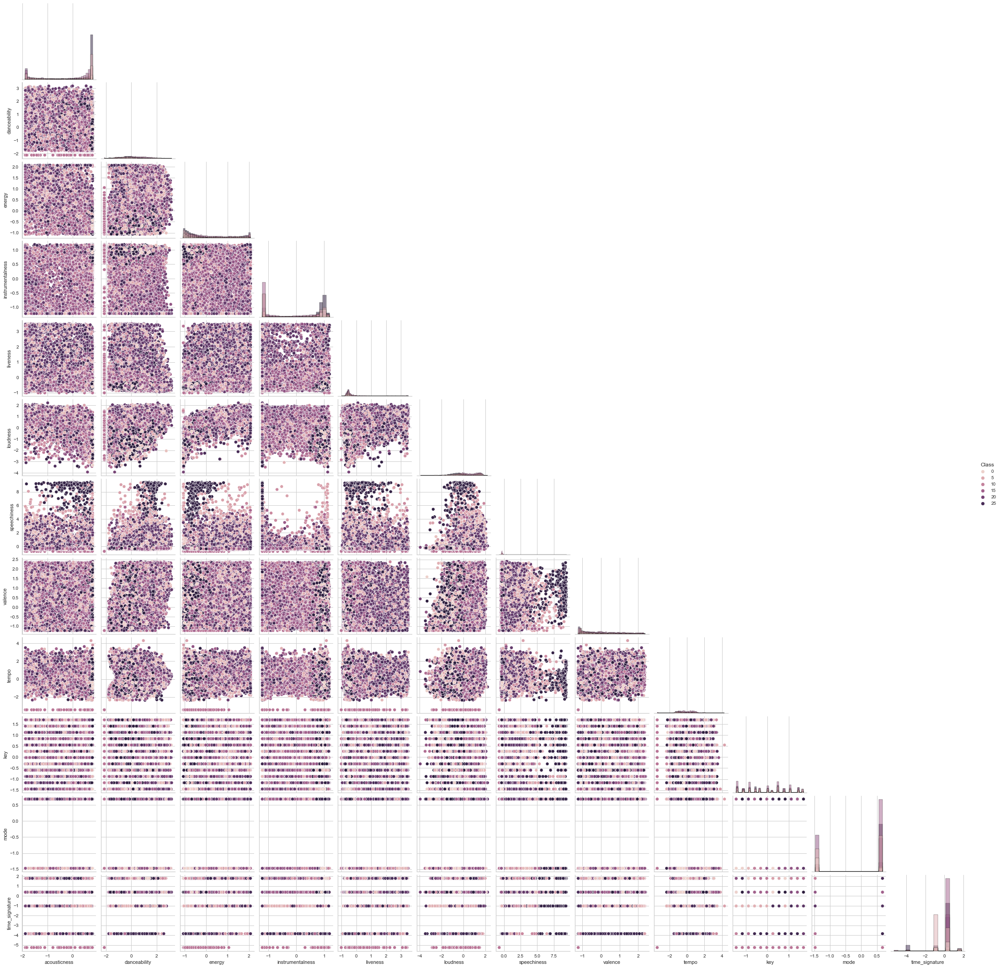

In [29]:
# Graficamos por par de variables
report_model = workData_std.copy()
report_model['Class'] = prediccion

sns.pairplot(data=report_model, hue='Class', corner=True, diag_kind='hist')

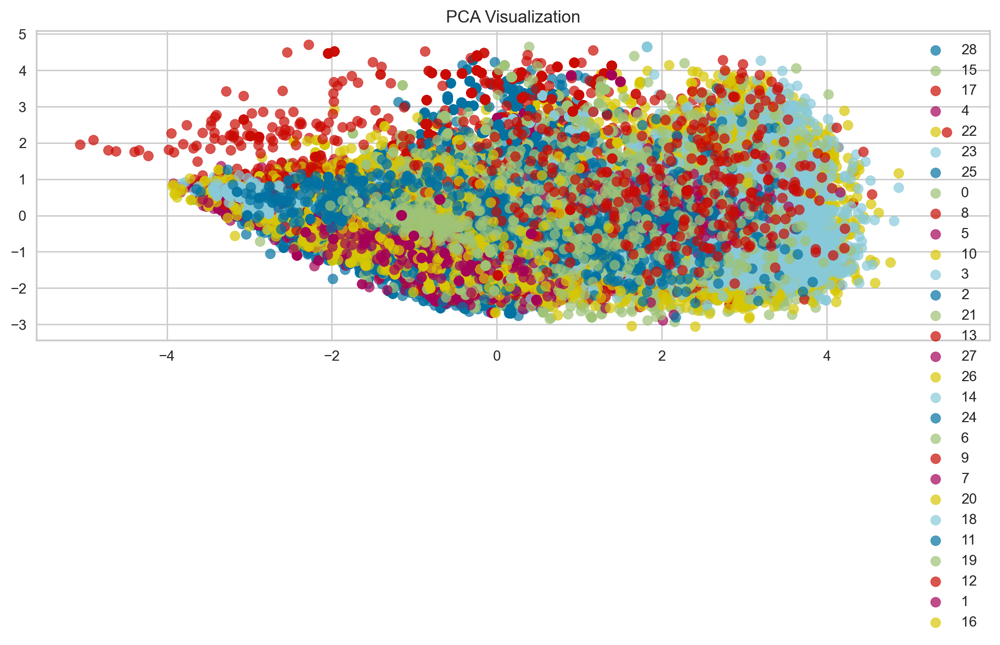

In [32]:
# Visualizando pca
df_labels_gaussian = pd.concat([df_std_pca[['x_pca','y_pca']], 
                              pd.DataFrame(prediccion,columns=['Class'])], axis = 1)

fig, ax1 = plt.subplots(figsize=(12,4), dpi=200)

for l in report_model.Class.unique():
    ax1.scatter(df_labels_gaussian[df_labels_gaussian.Class == l].loc[:,'x_pca'],
                df_labels_gaussian[df_labels_gaussian.Class == l].loc[:,'y_pca'],
                alpha = 0.7,
                label = l)

ax1.set_title("PCA Visualization")
ax1.legend()
plt.show()

# Paso 3: Interpretación de los clusters obtenidos
- Intente comprender los clusters obtenidos. Utilice las técnicas vistas en el curso (análisis de medias, PCA, etc) para analizar los clusters, intentando interpretar el por qué de la clusterización que obtuvo.


Al analizar los 6 clusters graficados en base a los PCA, resulta intuitivo el porqué se forman los clusters 0,1,2 y 5. Sin embargo, no es fácil identificar el porqué los clusters 3 y 4 se sobreponen a los anteriores.

Al analizar los clusters 1 y 3, es posible notar que no existen diferencias considerables entre la distribución que cada uno tiene en las distintas variables, por lo que aparentemente, el cluster 3 pareciera estar capturando los datos “ruidosos” del cluster 1.

Al hacer el mismo análisis para los clusters 2 y 4, aparentemente tenían el mismo comportamiento que tenían entre sí, los cluster 1 y 3. Sin embargo, al realizar un análisis más profundo en las distribuciones que posee cada cluster para cada variable, es posible observar cambios significativos en cómo distribuyen los datos en las variables acousticness, speechines y loudness, lo que explicaría el porqué los datos fueron agrupados en grupos distintos.

Finalmente, al realizar la clusterización pero considerando solamente 5 clusters, es posible observar que todos los cluster tienen un comportamiento heterogéneo en al menos una de las variables, lo que agrupa clusters que representan comportamientos específicos, diferenciados claramente entre sí y no se enfoca tanto en “ruidos” dentro de cada cluster, eliminando ambigüedades. A continuación se presentan los gráficos que sustentan este análisis.

DBSCAN, no entrega resultados concluyentes, ya que se ve afectado por la gran densidad de datos que presenta la muestra. El método Gaussiano tampoco entrega una mejor información ya que genera muchos clústers poco específicos y que se superponen.

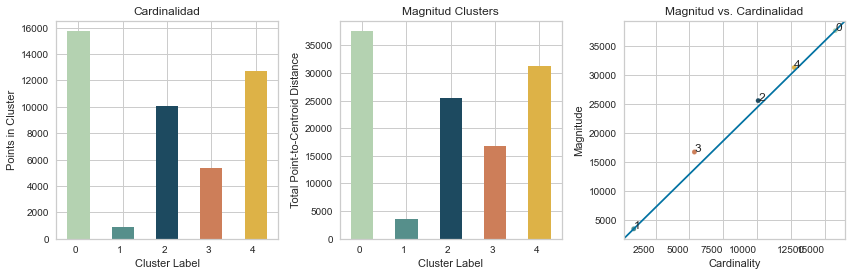

In [14]:
# Testeo de soluciones hasta el momento.
cluster_choice = 5
# Let's define max. 6 different cluster colors - if you like you can add here more.
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252', '#75f9f2']

km = KMeans(n_clusters= cluster_choice, 
            max_iter=300, 
            tol=1e-04, 
            init='k-means++', 
            n_init=10, 
            random_state=42, 
            algorithm='auto')

km_fit = km.fit(workData_std)

#!pip install data-science-utils
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12,4))

plot_cluster_cardinality(km_fit.labels_,
                         ax=ax1,
                         title="Cardinalidad",
                         color=cluster_colors
                        )
plot_cluster_magnitude(workData_std,
                       km_fit.labels_,
                       km_fit.cluster_centers_,
                       euclidean,
                       ax=ax2,
                       title="Magnitud Clusters",
                       color=cluster_colors
                      )
plot_magnitude_vs_cardinality(workData_std,
                              km_fit.labels_,
                              km_fit.cluster_centers_,
                              euclidean,
                              color=cluster_colors[0:km_fit.n_clusters],
                              ax=ax3, 
                              title="Magnitud vs. Cardinalidad")

fig.autofmt_xdate(rotation=0)
plt.tight_layout()
plt.show()

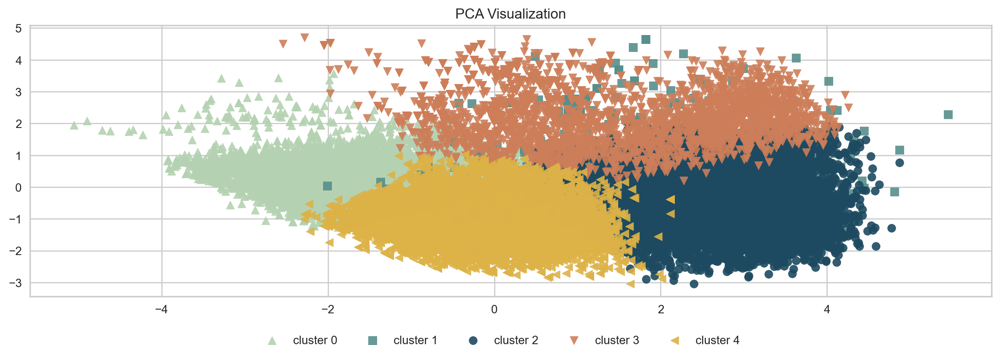

In [15]:
# Visualizing pca and pacmap
df_labels = pd.concat([pd.DataFrame(X_std_pca),pd.DataFrame(km_fit.labels_)], axis = 1)
df_labels.columns = ['x_pca','y_pca','labels']

fig, ax1 = plt.subplots(figsize=(12,4), dpi=200)

# PCA
pca_scaled_std = PCA(n_components=2,random_state=42)
X_std_pca = pca_scaled_std.fit_transform(workData_std)

for l, c, m in zip(range(0, 6), cluster_colors[0:km_fit.n_clusters], ('^', 's', 'o','v','<','1')):
    ax1.scatter(df_labels[df_labels.labels == l].loc[:,'x_pca'],
                df_labels[df_labels.labels == l].loc[:,'y_pca'],
                color=c,
                label='cluster %s' % l,
                alpha=0.9,
                marker=m
                )

ax1.set_title("PCA Visualization")
labels = np.unique(km_fit.labels_)
labels = ["cluster "+str(l) for l in labels]
fig.legend(labels, loc='lower center',ncol=len(labels), bbox_transform=(1,0),borderaxespad=-0.5)
plt.tight_layout()
plt.show()

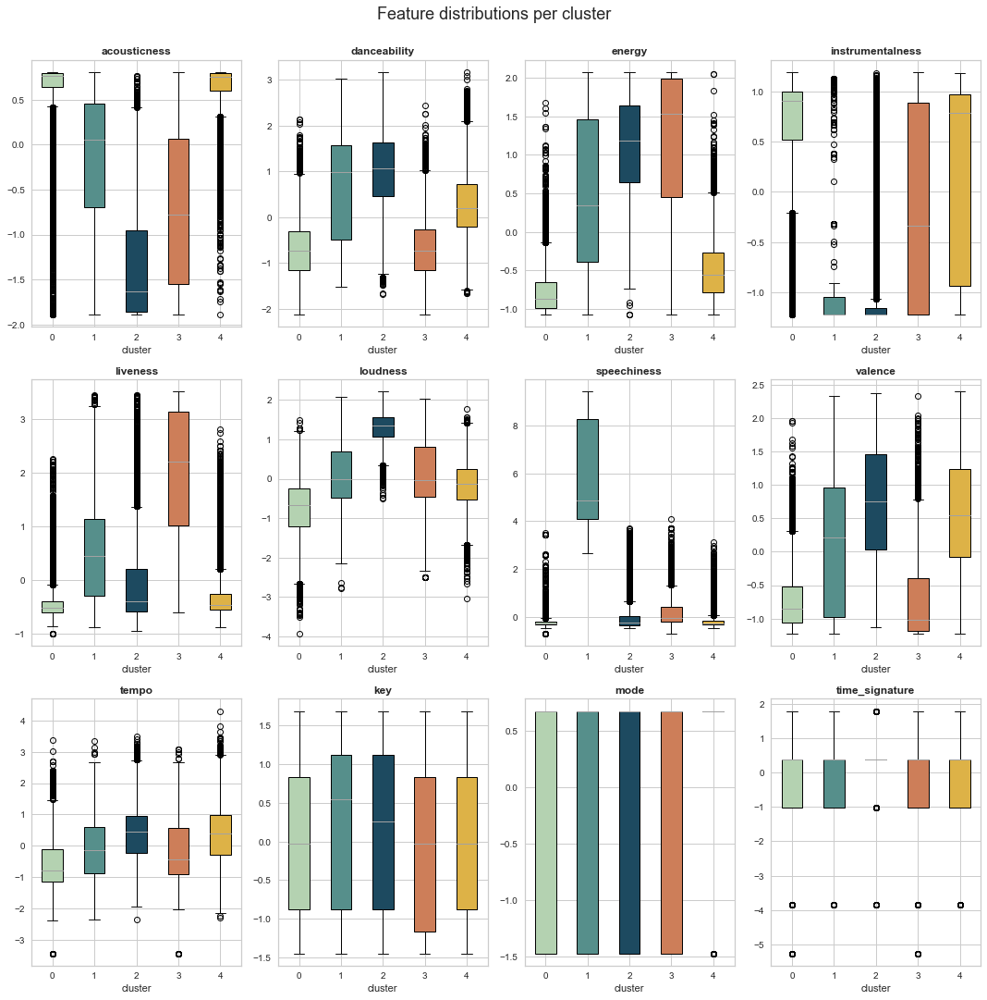

In [16]:
workData_std_labeled = pd.concat([workData_std,pd.DataFrame(km_fit.labels_, columns=['cluster'])],axis = 1)

features = workData_std.columns
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(15,15))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = workData_std_labeled[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_xlabel('cluster')
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=18, y=1)   
plt.tight_layout()
plt.show()

# Paso 4: Selección de playlist
- Escoga una canción de la lista, a partir de la cual le gustaría hacer una playlist.
- Vea el cluster asociado a esa canción, y seleccione otras canciones del mismo clusters, para crear una playlist de ~3 horas de duración. Para esto último, utilice el campo `duration_ms` que indica la duración de la canción.
- Escriba la lista de canciones seleccionadas, indicando su título y artista/grupo.

**Requisito**: Indique la canción seleccionada, así como la lista generada. Agregue después lo códigos utilizados para esto.

In [70]:
# Selección de canciones de la lista asociada al cluster
clusters = km_fit.labels_
clusterCancion = 1
origData2 = pd.concat([df.reset_index(drop = True),pd.DataFrame(clusters, columns = ['cluster'])], axis = 1)
cancionesCluster = (origData2[origData2.cluster == clusterCancion])

# Ver canciones del cluster
cancionesCluster.sample(20)

,artist_name,artist_id,album_id,album_type,album_release_date,album_release_year,album_release_date_precision,danceability,energy,key,...,track_preview_url,track_number,type,track_uri,external_urls.spotify,album_name,key_name,mode_name,key_mode,cluster
5719,Lou Reed,42TFhl7WlMRXiNqzSrnzPL,6xOGxzdpIAUZAaMwT50N01,album,2020-01-24,2020.0,day,0.479,0.33500,2,...,https://p.scdn.co/mp3-preview/0e9a702de327bb2d...,6,track,spotify:track:6ni7NZXvCJXje2mZnO21FT,https://open.spotify.com/track/6ni7NZXvCJXje2m...,The Bottom Line Archive Series,D,major,D major,1
14905,Mother Nature Sound FX,4lrOh2SR7H3guHky2lAYOk,78kWxFlC5sQe3x03L70RPd,album,2020-03-30,2020.0,day,0.302,0.87900,1,...,https://p.scdn.co/mp3-preview/d5022912a74c25a9...,2,track,spotify:track:4RIDD11EEJ9SbJCwr2YdwB,https://open.spotify.com/track/4RIDD11EEJ9SbJC...,! !/* Reflective *\! !,C#,major,C# major,1
22629,Frédéric Chopin,7y97mc3bZRFXzT2szRM4L4,69aoRIAIVb2TbIuxmxKYCR,album,2017-01-20,2017.0,day,0.723,0.22100,8,...,https://p.scdn.co/mp3-preview/35bc823c09a4f4a2...,1,track,spotify:track:4QlTZ8dQv0Up1B0vnVopNd,https://open.spotify.com/track/4QlTZ8dQv0Up1B0...,"Martha Argerich Live, Vol. 4",G#,major,G# major,1
2084,Megadeth,1Yox196W7bzVNZI7RBaPnf,5MWip84FEFaGFhSnozRXXY,album,2013-01-01,2013.0,day,0.574,0.22000,8,...,NaN,10,track,spotify:track:1OhCBp2E43dRUkhPUMZjOs,https://open.spotify.com/track/1OhCBp2E43dRUkh...,Super Collider (Commentary),G#,major,G# major,1
1800,Kevin Roldan,1RBzGO6Nm3uyhUSxP7EDWO,3vAg0D5nt0e7BE7J9u0uNt,album,2021-02-05,2021.0,day,0.723,0.60400,7,...,NaN,13,track,spotify:track:6uEi4LR5Jvv1c3zxAHJYRB,https://open.spotify.com/track/6uEi4LR5Jvv1c3z...,Bofff,G,major,G major,1
36638,Mother Nature Sound FX,4lrOh2SR7H3guHky2lAYOk,3LtgVsZP45cIDFRfffGYJf,album,2021-01-26,2021.0,day,0.381,0.99700,10,...,https://p.scdn.co/mp3-preview/22abd14de51ea4fb...,69,track,spotify:track:3qiHF1aQGSIjfCkjGuBIja,https://open.spotify.com/track/3qiHF1aQGSIjfCk...,70 Global Sounds,A#,minor,A# minor,1
11935,Mother Nature Sound FX,4lrOh2SR7H3guHky2lAYOk,7CcMW9En0ogvDWDW295lzR,album,2021-03-30,2021.0,day,0.300,0.87900,1,...,https://p.scdn.co/mp3-preview/563128d717443dea...,48,track,spotify:track:5nbJJ027zrQOQdezrBlDaN,https://open.spotify.com/track/5nbJJ027zrQOQde...,! ! ! ! Gentle Mother Nature Sounds ! ! ! !,C#,major,C# major,1
25632,Wolfgang Amadeus Mozart,4NJhFmfw43RLBLjQvxDuRS,3xmaIbt5lrQQzzz48L1Tcn,album,2017-06-01,2017.0,day,0.225,0.64600,7,...,NaN,23,track,spotify:track:3gQSKUPGGltEoyiBdIJrcb,https://open.spotify.com/track/3gQSKUPGGltEoyi...,Mozart 225 - The Late Operas,G,major,G major,1
12949,Pitbull,0TnOYISbd1XYRBk9myaseg,7rOcmdW8dWxlScy6AUgjI8,album,2006-10-31,2006.0,day,0.670,0.17400,2,...,https://p.scdn.co/mp3-preview/767f2238354d98ed...,6,track,spotify:track:3i0yPmdXovYNii91DpXciX,https://open.spotify.com/track/3i0yPmdXovYNii9...,El Mariel,D,major,D major,1
21238,Elton John,3PhoLpVuITZKcymswpck5b,2kf0ynF66zEMG2WxFnRwUd,album,2019-10-15,2019.0,day,0.699,0.23500,10,...,https://p.scdn.co/mp3-preview/efbc05c22adcbf53...,54,track,spotify:track:1RSSOpeW34dbju9i9Mwso1,https://open.spotify.com/track/1RSSOpeW34dbju9...,Me - Elton John Official Autobiography (Unabri...,A#,major,A# major,1


In [75]:
origData2[origData2.artist_name == '31 Minutos']

,artist_name,artist_id,album_id,album_type,album_release_date,album_release_year,album_release_date_precision,danceability,energy,key,...,track_preview_url,track_number,type,track_uri,external_urls.spotify,album_name,key_name,mode_name,key_mode,cluster
2758,31 Minutos,1EgVsKobLzbNgILxx9wrVG,5eymzke6O0xLndwXwltN2E,album,2005,2005.0,year,0.762,0.762,5,...,https://p.scdn.co/mp3-preview/eedc5a6f14f898ad...,19,track,spotify:track:50gqLeiGosmMNyj5f2dd2E,https://open.spotify.com/track/50gqLeiGosmMNyj...,"31 Minutos, Ratoncitos",F,minor,F minor,2
3289,31 Minutos,1EgVsKobLzbNgILxx9wrVG,2RTH0488SqLfL49MoQT2OL,album,2003,2003.0,year,0.688,0.608,9,...,https://p.scdn.co/mp3-preview/94bc354bedf66485...,13,track,spotify:track:2VKXvYQYzG3woDyhnQHhOl,https://open.spotify.com/track/2VKXvYQYzG3woDy...,31 Minutos,A,minor,A minor,2
3665,31 Minutos,1EgVsKobLzbNgILxx9wrVG,2auBApMDNDjfdG3bEj0las,album,2004,2004.0,year,0.000,0.422,10,...,NaN,3,track,spotify:track:7q6okjK9itlZKKy3u3I5oU,https://open.spotify.com/track/7q6okjK9itlZKKy...,31 Canciones de Amor y una Canción de Guaripolo,A#,major,A# major,3
3829,31 Minutos,1EgVsKobLzbNgILxx9wrVG,6m8Usxssnpra6Eo66kGARK,album,2013,2013.0,year,0.598,0.949,4,...,https://p.scdn.co/mp3-preview/856e60490d92e68f...,25,track,spotify:track:3wHbxaAaS1rqYBGyFCn5qt,https://open.spotify.com/track/3wHbxaAaS1rqYBG...,31 Minutos Gira Mundial (En Vivo),E,major,E major,2
10254,31 Minutos,1EgVsKobLzbNgILxx9wrVG,2RTH0488SqLfL49MoQT2OL,album,2003,2003.0,year,0.596,0.353,2,...,https://p.scdn.co/mp3-preview/57dcdab8d68697c8...,17,track,spotify:track:21N7SBB3nNlFcQNgHbNnm7,https://open.spotify.com/track/21N7SBB3nNlFcQN...,31 Minutos,D,minor,D minor,2
16958,31 Minutos,1EgVsKobLzbNgILxx9wrVG,3lhrBqbQbfPx4aMfP0pbkK,album,2015-09-04,2015.0,day,0.543,0.878,6,...,https://p.scdn.co/mp3-preview/0719fa71364e1048...,11,track,spotify:track:7DAn7InGHEu8QvlVYb2Tvz,https://open.spotify.com/track/7DAn7InGHEu8Qvl...,Arwrarwrirwrarwro (Banda Sonora Original de la...,F#,minor,F# minor,2
17700,31 Minutos,1EgVsKobLzbNgILxx9wrVG,2RTH0488SqLfL49MoQT2OL,album,2003,2003.0,year,0.775,0.387,5,...,https://p.scdn.co/mp3-preview/c4e9caecf62d744f...,19,track,spotify:track:7otis6XIvtnzD6FXHVsXRo,https://open.spotify.com/track/7otis6XIvtnzD6F...,31 Minutos,F,major,F major,2
24312,31 Minutos,1EgVsKobLzbNgILxx9wrVG,3lhrBqbQbfPx4aMfP0pbkK,album,2015-09-04,2015.0,day,0.778,0.891,9,...,https://p.scdn.co/mp3-preview/ef6d04459cabf518...,5,track,spotify:track:2jbUYDPtRv39rWnCdh3Ote,https://open.spotify.com/track/2jbUYDPtRv39rWn...,Arwrarwrirwrarwro (Banda Sonora Original de la...,A,minor,A minor,2
25141,31 Minutos,1EgVsKobLzbNgILxx9wrVG,5eymzke6O0xLndwXwltN2E,album,2005,2005.0,year,0.670,0.220,2,...,https://p.scdn.co/mp3-preview/62c3bd484ca9701e...,30,track,spotify:track:2LlQDWg2pEB1Az1SAzrSNB,https://open.spotify.com/track/2LlQDWg2pEB1Az1...,"31 Minutos, Ratoncitos",D,major,D major,2
25924,31 Minutos,1EgVsKobLzbNgILxx9wrVG,2RTH0488SqLfL49MoQT2OL,album,2003,2003.0,year,0.000,0.334,4,...,NaN,5,track,spotify:track:6UImacgkjF5Bj5NFUVCAJy,https://open.spotify.com/track/6UImacgkjF5Bj5N...,31 Minutos,E,major,E major,0


In [76]:
origData2.loc[2758, :]

artist_name                                                            31 Minutos
artist_id                                                  1EgVsKobLzbNgILxx9wrVG
album_id                                                   5eymzke6O0xLndwXwltN2E
album_type                                                                  album
album_release_date                                                           2005
album_release_year                                                         2005.0
album_release_date_precision                                                 year
danceability                                                                0.762
energy                                                                      0.762
key                                                                             5
loudness                                                                   -5.417
mode                                                                            0
speechiness     

In [78]:
# creación lista de 3 horas con canción de 31 minutos.
duracion = origData2.loc[2758, 'duration_ms']
lista_musical = [2758]
num_canciones_cluster = origData2[origData2.cluster == clusterCancion].shape[0]
while duracion < 3*60*60*1000: # 3 hrs x 60 min/hr x 60 sec/min x 1000 mSec/sec
    cancionAzar = cancionesCluster.sample(1)
    lista_musical.append(cancionAzar.index[0])
    duracion = duracion + int(cancionAzar['duration_ms'])

origData2.loc[lista_musical,['artist_name','track_name']]

,artist_name,track_name
2758,31 Minutos,Parque de Diversiones - Milton Ludovico
35589,Mother Nature Sound FX,Meditation Bird Loop
42510,Divididos,Niño Hereje
38203,Mother Nature Sound FX,Waterfall Bird Sings
29790,English Languagecast,Climate Change: Tips for Daily Life
...,...,...
30103,Elton John,Chapter 207 - Me - Elton John Official Autobio...
18965,Johann Sebastian Bach,"Wege zur Musik aus der Johannes-Passion, Pt. 2..."
9047,Mother Nature Sound FX,Chirping at the Stream
16510,Jason Mraz,Long Drive - Commentary


# BONUS:  Conectarse a la API de Spotify

Spotify a través de su paquete `spotipy` permite conectarse a la API de Spotify para hacer busquedas, información, o guardar la lista que creó.  Como bonus de su nota (+0.5 puntos) transforme su lista encontrada en una playlist de Spotify, y compartala para el resto del curso.

Para mas información de la API, ver

- https://developer.spotify.com/documentation/web-api/quick-start/
- https://medium.com/@maxtingle/getting-started-with-spotifys-api-spotipy-197c3dc6353b
- https://spotipy.readthedocs.io/

In [79]:
!pip install spotipy

In [80]:
#Instalando una nueva libreria
import spotipy
from spotipy.oauth2 import SpotifyOAuth

#Conectandose con spotify
cid = 'dd24ee01d7c94142b0ad22f784356259'
secret = '0c95f78c52534b2c88047d0fd351f8dd'
scope = "playlist-modify-public"
sp = spotipy.Spotify(auth_manager=SpotifyOAuth(scope=scope, client_id=cid, client_secret=secret, redirect_uri='https://localhost:8883/callback'))
print(sp)

In [81]:
sp.me()

{'display_name': 'eduardorossel',
 'external_urls': {'spotify': 'https://open.spotify.com/user/eduardorossel'},
 'followers': {'href': None, 'total': 3},
 'href': 'https://api.spotify.com/v1/users/eduardorossel',
 'id': 'eduardorossel',
 'images': [],
 'type': 'user',
 'uri': 'spotify:user:eduardorossel'}

In [82]:
sp.user_playlist_create('eduardorossel', 'Clusters_MDS_31_Minutos')

{'collaborative': False,
 'description': '',
 'external_urls': {'spotify': 'https://open.spotify.com/playlist/3kaKUnzGxELRkiocs9YjLf'},
 'followers': {'href': None, 'total': 0},
 'href': 'https://api.spotify.com/v1/playlists/3kaKUnzGxELRkiocs9YjLf',
 'id': '3kaKUnzGxELRkiocs9YjLf',
 'images': [],
 'name': 'Clusters_MDS_31_Minutos',
 'owner': {'display_name': 'eduardorossel',
  'external_urls': {'spotify': 'https://open.spotify.com/user/eduardorossel'},
  'href': 'https://api.spotify.com/v1/users/eduardorossel',
  'id': 'eduardorossel',
  'type': 'user',
  'uri': 'spotify:user:eduardorossel'},
 'primary_color': None,
 'public': True,
 'snapshot_id': 'MSw0NTJmMTBkOWRiNzNiYTRhNTAyOWY3YjU1MTYzYTAwODk1YjRlNzI5',
 'tracks': {'href': 'https://api.spotify.com/v1/playlists/3kaKUnzGxELRkiocs9YjLf/tracks',
  'items': [],
  'limit': 100,
  'next': None,
  'offset': 0,
  'previous': None,
  'total': 0},
 'type': 'playlist',
 'uri': 'spotify:playlist:3kaKUnzGxELRkiocs9YjLf'}

In [83]:
newPlaylistId = '3kaKUnzGxELRkiocs9YjLf'

In [84]:
trackIDs = list(origData2.loc[lista_musical,'track_id'])

In [85]:
sp.user_playlist_add_tracks('eduardorossel',newPlaylistId, trackIDs)

{'snapshot_id': 'MiwwZmE0MDczZTFlOGYxZjkxOGJjMzg5OGM0MzY0NTQ1ZmY2ZDIyOTRm'}

Las lista está disponible en https://open.spotify.com/playlist/3kaKUnzGxELRkiocs9YjLf?si=dd4dfd5de9884951
![spotify_3](spotify_3.png)